# **Intelligent Analysis on Satellite Imagery | R&D**
## Land Cover Classification on satellite Imagery










# **Import Packages**

In [ ]:
# import the required libraries  
%reload_ext autoreload
%autoreload 2
%matplotlib inline
from fastai.vision import *  # import the vision module
from fastai.metrics import error_rate  # import our evaluation metric
import zipfile # import module to unzip the data
import urllib.request 
import os # import module to access file paths

In [ ]:
import shutil
shutil.rmtree('/content/Eurosat-Project/images/HerbaceousVegetation', ignore_errors=True)

In [ ]:
!git clone https://github.com/pauldamsa/Eurosat-Project.git

Cloning into 'Eurosat-Project'...
remote: Enumerating objects: 14, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 27027 (delta 2), reused 0 (delta 0), pack-reused 27013
Receiving objects: 100% (27027/27027), 101.85 MiB | 26.71 MiB/s, done.
Resolving deltas: 100% (2/2), done.
Checking out files: 100% (27007/27007), done.


In [ ]:

seed_value= 0
import os
os.environ['PYTHONHASHSEED']=str(seed_value)
import random
random.seed(seed_value)
import numpy as np
np.random.seed(seed_value)
import tensorflow as tf
tf.random.set_seed(seed_value)
session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn import metrics
import os
import pandas as pd
import numpy as np
import seaborn as sns
import math 
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import cv2

# **Load Data**

In [ ]:
class Image:
  """
    This class will be used for mantaining informations about an image
  """
  def __init__(self, category_name):

    
    self.category_name = category_name

    # A list with images of the person
    self.category_images = []
  
  def getCategoryName(self):
    return self.category_name

  def getCategoryImages(self):
    return self.category_images
  
  def addImage(self, image):
    """
      This function is used for adding an image with person to his/her list

      Arguments:
        image: the image we want to add (numpy array)
    """
    self.category_images.append(image)

def testImageClass():
  """
    This function is used for testing the Image class
  """
  img = Image("Vegetation")

  assert img.getCategoryName() == "Vegetation"
  assert img.getCategoryName() != "awd"
  assert len(img.getCategoryImages()) == 0

  img.addImage(3)
  assert len(img.getCategoryImages()) == 1

testImageClass()

class RepositoryImages:
  """
    This class will be used for storing the images
  """
  def __init__(self):

    # A dictionary in this form {category: Image(category, category_images) }
    self.images = {}

  def getAllImages(self):
    """
      This function is used for getting all images 

      Return:
        A list with all images from dict that contains Image objects
    """
    return list(self.images.values())
  
  def find(self, category):
    """
      This function is used for getting the images of a category

      Arguments:
        category: a string which represents the name of the category that we want to find
      
      Return:
        A object Image
    """
    return self.images[category]
  
  def read(self, path_to_dataset):
    """
      This function is used for reading the images from directories

      Arguments:
        path_to_dataset: the path where the images are stored
    """
    directories = os.listdir(path_to_dataset)

    self.images = {}
    print("Total directories: " +str(len(directories)))

    # Iterate thorugh directories of path_to_dataset directory
    for directory in directories:

      # Get the name of each directory
      name_of_images = os.listdir(path_to_dataset + directory)
      print("Current directory: " + directory + " " + str(len(name_of_images)))

      # Iterate through images
      for name_of_image in name_of_images:

        # If the image is already in dictionary
        if directory in self.images.keys():

          # Read the image
          image = cv2.imread(path_to_dataset + directory + "/" + name_of_image)

          # Add new image 
          self.images[directory].addImage(image)

        else:
          # Read the image
          image = Image(directory)
          image.addImage(cv2.imread(path_to_dataset + directory + "/" + name_of_image))
          self.images[directory] = image

def testRepository():
  assert len(repo.getAllImages()) == 10

In [ ]:
repository = RepositoryImages()
repository.read("/content/Eurosat-Project/images/")

Total directories: 6
Current directory: .ipynb_checkpoints 0
Current directory: BarrenLand 3000
Current directory: Pasture 2000
Current directory: Vegetation 3000
Current directory: Urban 3000
Current directory: Water 2500


In [ ]:
class Service:
  """
    This class will be used for working with the while database of images
  """
  def __init__(self, repo):
    self.repo = repo
  
  def getAllImages(self):
    """
      This function is used for getting all images

      Return:
        A list with all images
    """
    return self.repo.getAllImages()

  def find(self, name_category):
    """
      This function is used for getting the images of a category

      Arguments:
        name_category: a string which represents the name of the category that we want to find
      
      Return:
        A object Image
    """
    return self.repo.find(name_category)
  
  def make_flat(self,input_list):
    """
      input_list: a list of lists
    """
    flat_list = []
    for sublist in input_list:
        for item in sublist:
            flat_list.append(item)
    return flat_list

  
  def displayImagesOfCategory(self, name_category):
    """
      This function is used for displaying the images of a category

      Arguments:
        name_category: a string which represents the name of a category that we want to see his/her images
    """
    # Define the dimensions of the plot grid 
    list_of_images = self.find(name_category).getCategoryImages()
    dim = math.floor(math.sqrt(len(list_of_images[:100])))
    W_grid = dim
    L_grid = dim

    # fig, axes = plt.subplots(L_grid, W_grid)
    # subplot return the figure object and axes object
    # we can use the axes object to plot specific figures at various locations

    fig, axes = plt.subplots(L_grid, W_grid, figsize = (25,25))

    axes = axes.ravel() 

    index = 0
    for i in np.arange(0, W_grid * L_grid):

        # read and display an image with the selected index    
        axes[i].imshow(cv2.cvtColor(np.uint8(list_of_images[index]), cv2.COLOR_BGR2RGB))
        axes[i].set_title(name_category + "_" + str(i), fontsize = 10)
        index+=1
        axes[i].axis('off')

    plt.subplots_adjust(hspace=0.4)
  
  def displayFrequencyHistogram(self):
    """
      This function is used to show a histogram of image frequency for each category
    """

    # Get all images
    images = self.getAllImages()
    
    frequency = [] # the number of images that corresponds to each category
    categories = [] # the name of each category

    # Iterate through images
    for image in images:
      frequency.append(len(image.getCategoryImages()))
      categories.append(image.getCategoryName())

    fig = go.Figure(data=[go.Bar(x = categories, y = frequency)])  

    fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',marker_line_width=1.5, opacity=0.6)
    fig.update_layout(title_text = "Image frequency on each category")

    fig.show()
  
  def get_data_frame_of_frequency(self):
    """
      This function is used for getting the distribution of the dataset

      Return:
        A dataframe
    """
    # The rows for dataframe
    rows = []

    # Get images
    images = self.getAllImages()
    
    frequency = [] # the number of images that corresponds to each category
    categories = [] # the name of each category

    # Iterate through images
    for image in images:
      frequency.append(len(image.getCategoryImages()))
      categories.append(image.getCategoryName())
    
    total_images = sum(frequency)

    for i in range(len(categories)):
      category = categories[i]
      number_images_category = frequency[i]

      percent = round((number_images_category * 100) / total_images, 2)

      row = [category, number_images_category, percent, total_images]
      rows.append(row)

    df = pd.DataFrame(data = rows, columns=["Category", "Number of images", "Percent", "Total images"])
    return df

In [ ]:
service = Service(repository)

# **Display images**

### Display images of AnnualCrop

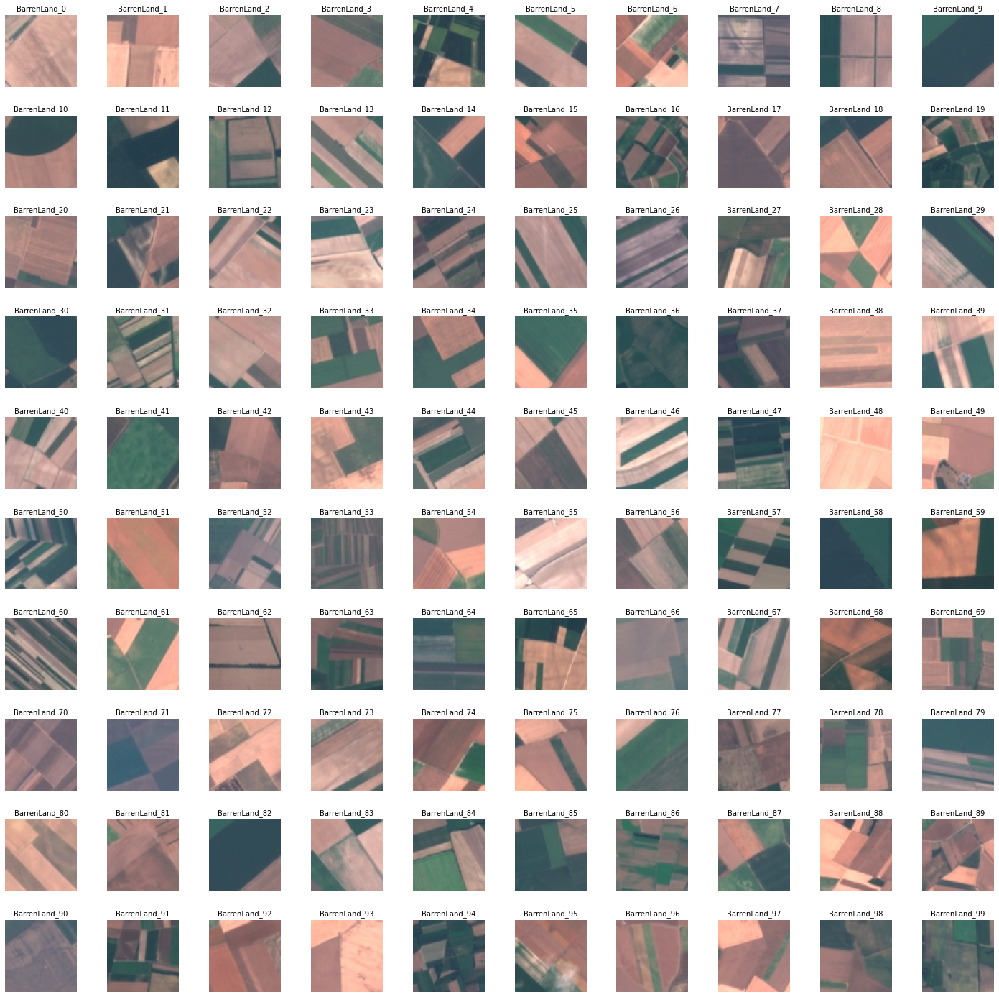

In [ ]:
service.displayImagesOfCategory("BarrenLand")

### Display images of Pasture

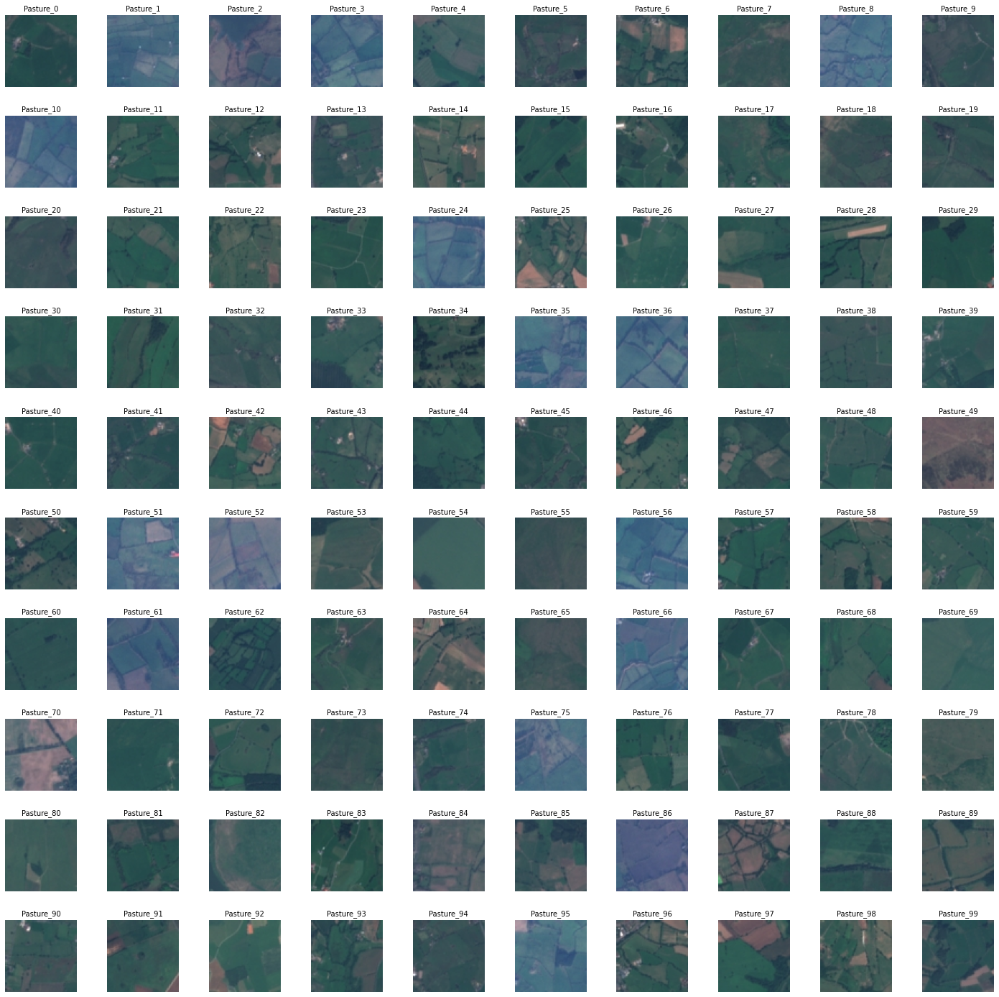

In [ ]:
service.displayImagesOfCategory("Pasture")

### Display images of Vegetation

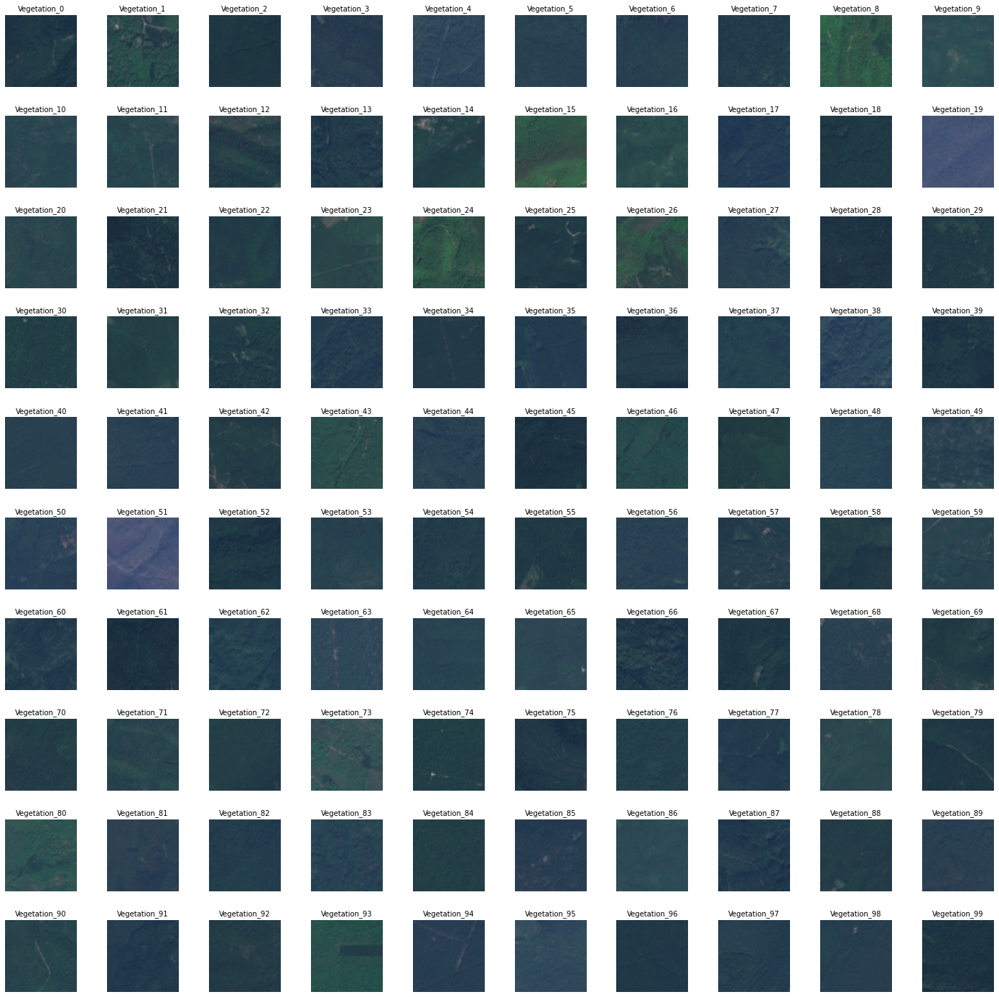

In [ ]:
service.displayImagesOfCategory("Vegetation")

### Display images of Urban

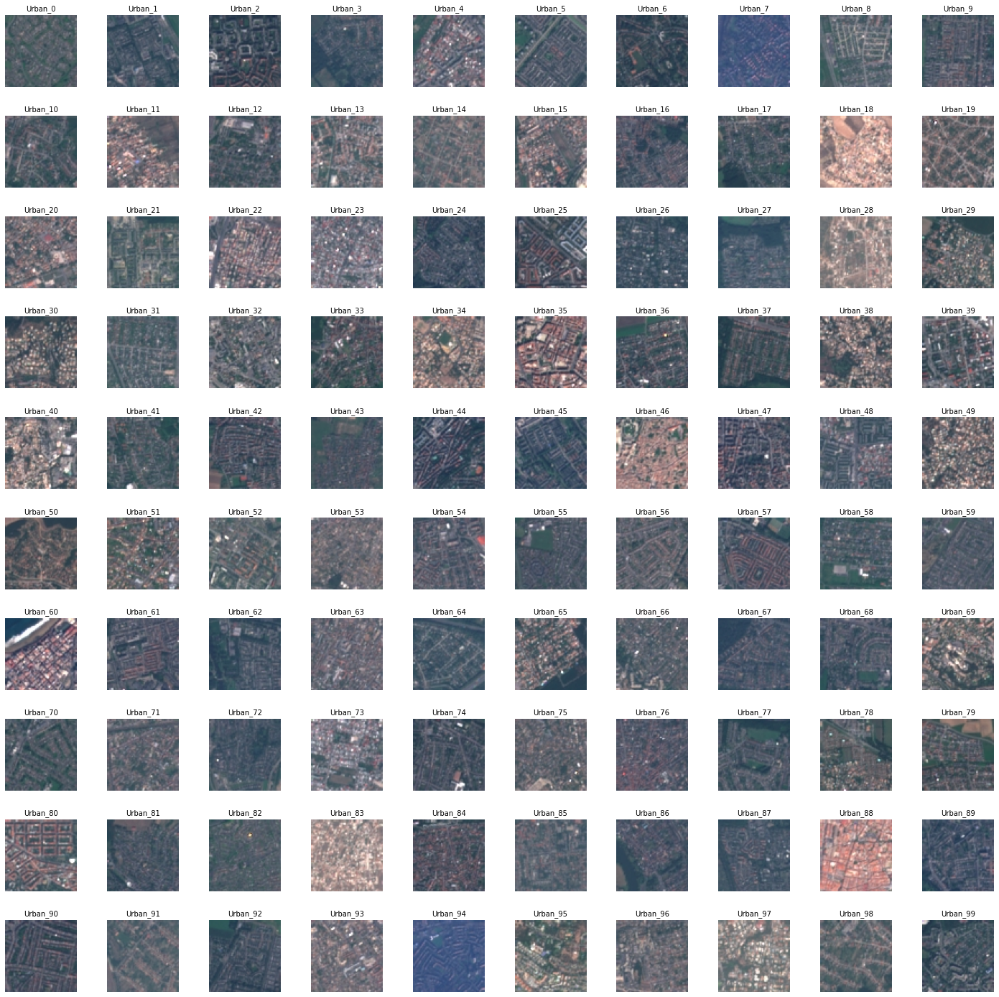

In [ ]:
service.displayImagesOfCategory("Urban")

### Display images of Water

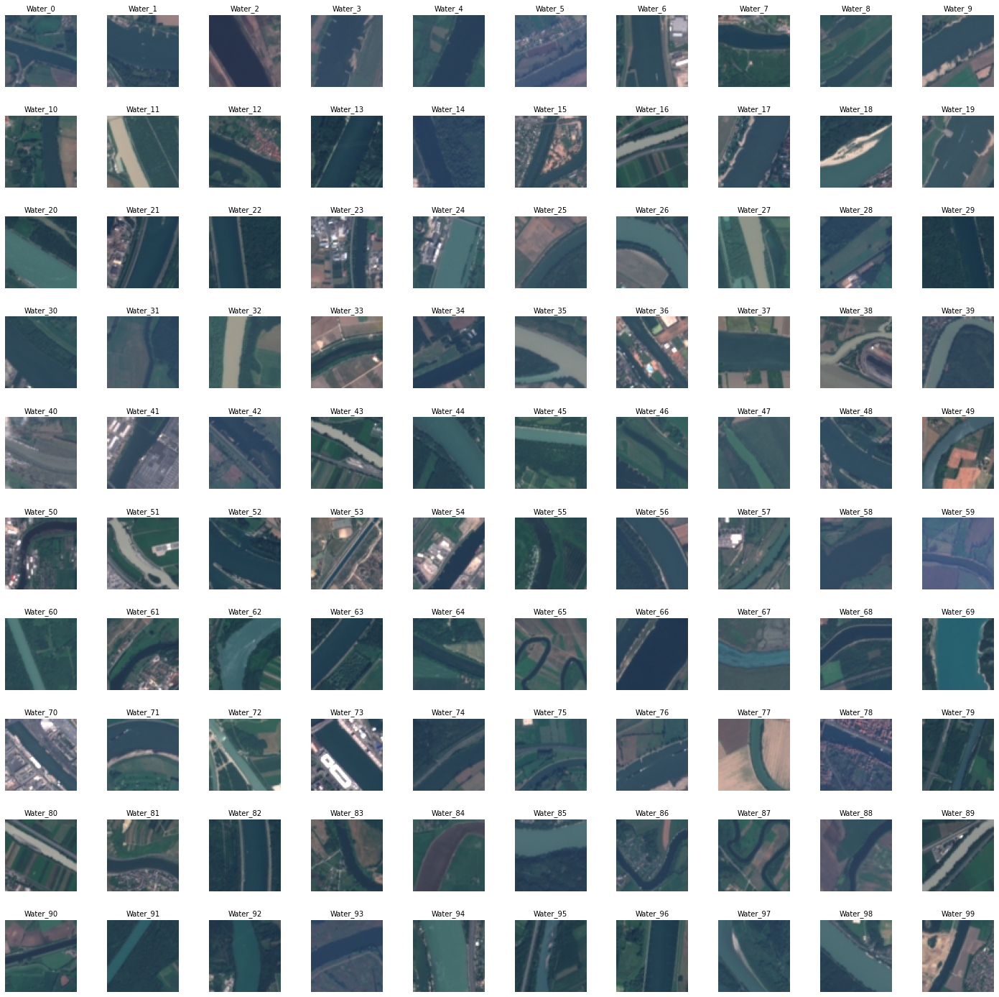

In [ ]:
service.displayImagesOfCategory("Water")

# **Distribution analysis**

### Histogram

In [ ]:
service.displayFrequencyHistogram()

### Tables

In [ ]:
df = service.get_data_frame_of_frequency()

In [ ]:
df.sort_values(by="Percent", ignore_index=True)

,Category,Number of images,Percent,Total images
0,Pasture,2000,14.81,13500
1,Water,2500,18.52,13500
2,BarrenLand,3000,22.22,13500
3,Vegetation,3000,22.22,13500
4,Urban,3000,22.22,13500


In [ ]:
df.describe()

,Number of images,Percent,Total images
count,5.000000,5.000000,5.0
mean,2700.000000,19.998000,13500.0
std,447.213595,3.313294,0.0
min,2000.000000,14.810000,13500.0
25%,2500.000000,18.520000,13500.0
50%,3000.000000,22.220000,13500.0
75%,3000.000000,22.220000,13500.0
max,3000.000000,22.220000,13500.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Category          5 non-null      object 
 1   Number of images  5 non-null      int64  
 2   Percent           5 non-null      float64
 3   Total images      5 non-null      int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 288.0+ bytes


# **ML development**

### Split the data

In [ ]:
percent_train = 0.8
percent_val = 0.1
percent_test = 0.1

In [ ]:
BarrenLand_imgs = service.find("BarrenLand").getCategoryImages()
Vegetation_imgs = service.find("Vegetation").getCategoryImages()
pasture_imgs = service.find("Pasture").getCategoryImages()
Urban_imgs = service.find("Urban").getCategoryImages()
Water_imgs = service.find("Water").getCategoryImages()
imgs = [BarrenLand_imgs, Vegetation_imgs,  pasture_imgs,Urban_imgs,Water_imgs]

In [ ]:
X_train = []
y_train = []

X_val = []
y_val = []

X_test = []
y_test = []

i = 0
for set_imgs in imgs:
  train_index = int(len(set_imgs) * percent_train)
  val_index = int(len(set_imgs) * (percent_train + percent_val))
  test_index = int(len(set_imgs) * (percent_train + percent_val + percent_test))

  X_train += set_imgs[:train_index]
  X_val += set_imgs[train_index + 1: val_index]
  X_test += set_imgs[val_index + 1: test_index]

  y_train += [i for k in range(len(set_imgs[:train_index]))]
  y_val += [i for k in range(len(set_imgs[train_index + 1: val_index]))]
  y_test += [i for k in range(len(set_imgs[val_index + 1: test_index]))]

  i += 1

X_train = np.asarray(X_train, dtype="float32")
y_train = np.asarray(y_train, dtype="float32")

X_val = np.asarray(X_val, dtype="float32")
y_val = np.asarray(y_val, dtype="float32")

X_test = np.asarray(X_test, dtype="float32")
y_test = np.asarray(y_test, dtype="float32")

#### Check the distributions of classes 

In [ ]:
fig = go.Figure()

x = ["Train", "Val", "Test"]

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 0]), len([0 for i in y_val if i == 0]), len([0 for i in y_test if i == 0])],
    name='BarrenLand',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 1]), len([0 for i in y_val if i == 1]), len([0 for i in y_test if i == 1])],
    name='Urban',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 2]), len([0 for i in y_val if i == 2]), len([0 for i in y_test if i == 2])],
    name='Vegetation',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 3]), len([0 for i in y_val if i == 3]), len([0 for i in y_test if i == 3])],
    name='Pasture',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 4]), len([0 for i in y_val if i == 4]), len([0 for i in y_test if i == 4])],
    name='Water',
))






fig.update_layout(barmode='group', xaxis_tickangle=-45, showlegend=True)
fig.show()

### Model

#### Architecture

In [ ]:
class BasicBlock(tf.keras.layers.Layer):

    def __init__(self, filter_num, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(3, 3),
                                            strides=stride,
                                            padding="same")
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.conv2 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(3, 3),
                                            strides=1,
                                            padding="same")
        self.bn2 = tf.keras.layers.BatchNormalization()
        if stride != 1:
            self.downsample = tf.keras.Sequential()
            self.downsample.add(tf.keras.layers.Conv2D(filters=filter_num,
                                                       kernel_size=(1, 1),
                                                       strides=stride))
            self.downsample.add(tf.keras.layers.BatchNormalization())
        else:
            self.downsample = lambda x: x

    def call(self, inputs, training=None, **kwargs):
        residual = self.downsample(inputs)

        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.conv2(x)
        x = self.bn2(x, training=training)

        output = tf.nn.relu(tf.keras.layers.add([residual, x]))

        return output


class BottleNeck(tf.keras.layers.Layer):
    def __init__(self, filter_num, stride=1):
        super(BottleNeck, self).__init__()
        self.conv1 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(1, 1),
                                            strides=1,
                                            padding='same')
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.conv2 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(3, 3),
                                            strides=stride,
                                            padding='same')
        self.bn2 = tf.keras.layers.BatchNormalization()
        self.conv3 = tf.keras.layers.Conv2D(filters=filter_num * 4,
                                            kernel_size=(1, 1),
                                            strides=1,
                                            padding='same')
        self.bn3 = tf.keras.layers.BatchNormalization()

        self.downsample = tf.keras.Sequential()
        self.downsample.add(tf.keras.layers.Conv2D(filters=filter_num * 4,
                                                   kernel_size=(1, 1),
                                                   strides=stride))
        self.downsample.add(tf.keras.layers.BatchNormalization())

    def call(self, inputs, training=None, **kwargs):
        residual = self.downsample(inputs)

        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.conv2(x)
        x = self.bn2(x, training=training)
        x = tf.nn.relu(x)
        x = self.conv3(x)
        x = self.bn3(x, training=training)

        output = tf.nn.relu(tf.keras.layers.add([residual, x]))

        return output


def make_basic_block_layer(filter_num, blocks, stride=1):
    res_block = tf.keras.Sequential()
    res_block.add(BasicBlock(filter_num, stride=stride))

    for _ in range(1, blocks):
        res_block.add(BasicBlock(filter_num, stride=1))

    return res_block


def make_bottleneck_layer(filter_num, blocks, stride=1):
    res_block = tf.keras.Sequential()
    res_block.add(BottleNeck(filter_num, stride=stride))

    for _ in range(1, blocks):
        res_block.add(BottleNeck(filter_num, stride=1))

    return res_block

In [ ]:
class ResNet(tf.keras.Model):
    def __init__(self, layer_params):
        super(ResNet, self).__init__()
        self.conv1 = tf.keras.layers.Conv2D(filters=64,
                                            kernel_size=(7, 7),
                                            strides=2,
                                            padding="same")
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.pool1 = tf.keras.layers.MaxPool2D(pool_size=(3, 3),
                                               strides=2,
                                               padding="same")

        self.layer1 = make_bottleneck_layer(filter_num=64,
                                            blocks=layer_params[0])
        self.layer2 = make_bottleneck_layer(filter_num=128,
                                            blocks=layer_params[1],
                                            stride=2)
        self.layer3 = make_bottleneck_layer(filter_num=256,
                                            blocks=layer_params[2],
                                            stride=2)
        self.layer4 = make_bottleneck_layer(filter_num=512,
                                            blocks=layer_params[3],
                                            stride=2)

        self.avgpool = tf.keras.layers.GlobalAveragePooling2D()
        self.fc = tf.keras.layers.Dense(units=10, activation=tf.keras.activations.softmax)

    def call(self, inputs, training=None, mask=None):
        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.pool1(x)
        x = self.layer1(x, training=training)
        x = self.layer2(x, training=training)
        x = self.layer3(x, training=training)
        x = self.layer4(x, training=training)
        x = self.avgpool(x)
        output = self.fc(x)

        return output

def resnet_50():
    return ResNet(layer_params=[3, 4, 6, 3])
model = resnet_50()

#### Build

In [ ]:
model.build(input_shape=(None, 64, 64, 3))

#### Summary

In [ ]:
model.summary()

Model: "res_net"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              multiple                  9472      
_________________________________________________________________
batch_normalization (BatchNo multiple                  256       
_________________________________________________________________
max_pooling2d (MaxPooling2D) multiple                  0         
_________________________________________________________________
sequential (Sequential)      multiple                  353664    
_________________________________________________________________
sequential_4 (Sequential)    multiple                  2024448   
_________________________________________________________________
sequential_9 (Sequential)    multiple                  12397568  
_________________________________________________________________
sequential_16 (Sequential)   multiple                  2340

### Train

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
# SGD optimizer
sgd_optimizer = tf.optimizers.SGD(learning_rate=0.01,  momentum=0.9)

model.compile(
    optimizer = sgd_optimizer,
    loss = "sparse_categorical_crossentropy",
    metrics = ['accuracy']
)

In [ ]:
checkpoint = ModelCheckpoint("/content/model.h5", monitor='val_accuracy', verbose=2, save_best_only=True, mode='max')

In [ ]:
history = model.fit(
    x = X_train, 
    y = y_train, 
    validation_data = (X_val, y_val),
    batch_size = 128,
    verbose = 1,
    epochs = 10,
    callbacks = [checkpoint]
  )

Epoch 1/10
85/85 [==============================] - ETA: 0s - loss: 1.1144 - accuracy: 0.6109
Epoch 00001: val_accuracy improved from -inf to 0.22156, saving model to /content/model.h5
85/85 [==============================] - 49s 575ms/step - loss: 1.1144 - accuracy: 0.6109 - val_loss: 2170.5198 - val_accuracy: 0.2216
Epoch 2/10
85/85 [==============================] - ETA: 0s - loss: 0.5461 - accuracy: 0.8045
Epoch 00002: val_accuracy improved from 0.22156 to 0.31599, saving model to /content/model.h5
85/85 [==============================] - 44s 514ms/step - loss: 0.5461 - accuracy: 0.8045 - val_loss: 2.8455 - val_accuracy: 0.3160
Epoch 3/10
85/85 [==============================] - ETA: 0s - loss: 0.3795 - accuracy: 0.8594
Epoch 00003: val_accuracy improved from 0.31599 to 0.33160, saving model to /content/model.h5
85/85 [==============================] - 44s 515ms/step - loss: 0.3795 - accuracy: 0.8594 - val_loss: 1.9671 - val_accuracy: 0.3316
Epoch 4/10
85/85 [======================

### Evaluation

In [ ]:
x = np.arange(10)

fig = go.Figure()

fig.add_trace(go.Scatter(x=x, y= history.history['accuracy'], name="Train"))
fig.add_trace(go.Scatter(x=x, y= history.history['val_accuracy'], name="Validation"))

fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=x, y= history.history['loss'], name="Train"))
fig.add_trace(go.Scatter(x=x, y= history.history['val_loss'], name="Validation"))

fig.show()

In [ ]:
model.load_weights("./model.h5")

In [ ]:
# Get the accuracy and loss on test set
loss, acc = model.evaluate(X_test,  y_test,batch_size=128, verbose=2)
print('Model, accuracy: {:5.2f}%'.format(100*acc))

11/11 - 1s - loss: 0.2145 - accuracy: 0.9227
Model, accuracy: 92.27%


In [ ]:
y_pred = model.predict(X_test,batch_size=128,verbose=1)

11/11 [==============================] - 1s 129ms/step


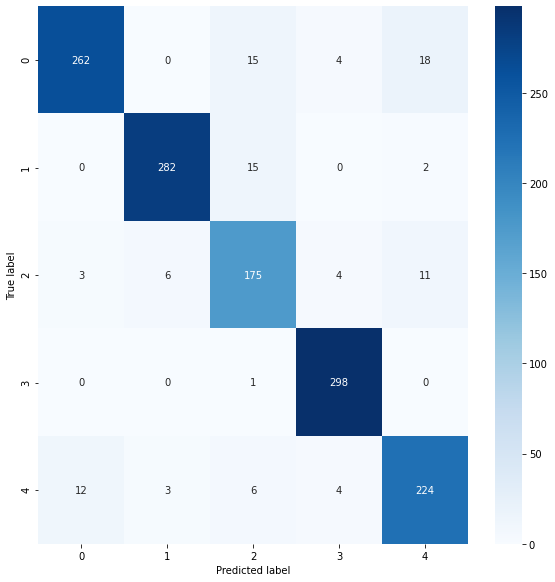

In [ ]:
# Get the confusion matrix
conf_matrix = metrics.confusion_matrix(y_test, y_pred.argmax(axis = 1))

# Plot the confusion matrix
figure = plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True,cmap=plt.cm.Blues, fmt="d")
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [ ]:
# Print the classification Report
class_names = ['BarrenLand', 'Urban','Vegetation',  'Pasture', 'Water' ]
print(metrics.classification_report(y_test, y_pred.argmax(axis=1), target_names=class_names))

              precision    recall  f1-score   support

  BarrenLand       0.95      0.88      0.91       299
       Urban       0.97      0.94      0.96       299
  Vegetation       0.83      0.88      0.85       199
     Pasture       0.96      1.00      0.98       299
       Water       0.88      0.90      0.89       249

    accuracy                           0.92      1345
   macro avg       0.92      0.92      0.92      1345
weighted avg       0.92      0.92      0.92      1345



**Verification and fine tuning of Model**

In [ ]:
data_path = os.getcwd()
path = datapath4file(data_path+'/Eurosat-Project/images')

In [ ]:
tfms = get_transforms(flip_vert=True, max_warp = 0.)

In [ ]:
data = ImageDataBunch.from_folder(path, train = ".", 
                                  valid_pct=0.2, 
                                  ds_tfms = tfms, 
                                  size=224, bs = 32).normalize(imagenet_stats)

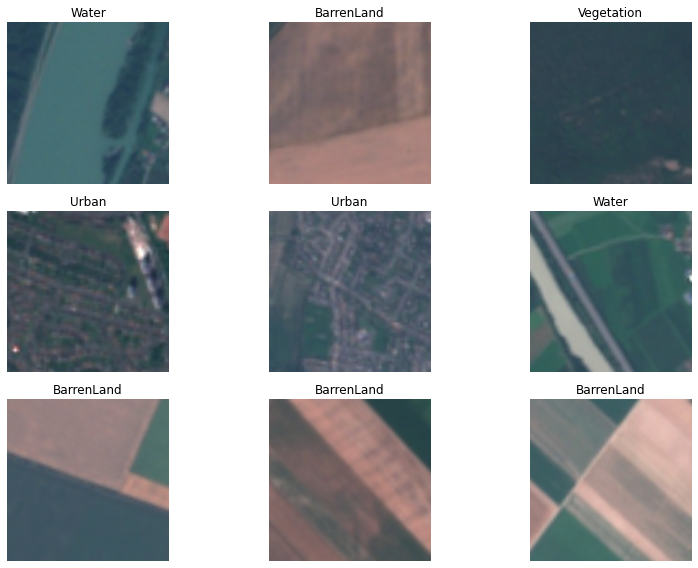

In [ ]:
data.show_batch(rows=3, figsize=(12,8))

In [ ]:
learn = cnn_learner(data, models.resnet50, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


In [ ]:
print(learn.summary())

Sequential
Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [64, 112, 112]       9,408      False     
______________________________________________________________________
BatchNorm2d          [64, 112, 112]       128        True      
______________________________________________________________________
ReLU                 [64, 112, 112]       0          False     
______________________________________________________________________
MaxPool2d            [64, 56, 56]         0          False     
______________________________________________________________________
Conv2d               [64, 56, 56]         4,096      False     
______________________________________________________________________
BatchNorm2d          [64, 56, 56]         128        True      
______________________________________________________________________
Conv2d               [64, 56, 56]         36,864     False     
___________________________________________________

epoch,train_loss,valid_loss,error_rate,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 8.32E-04
Min loss divided by 10: 1.45E-02


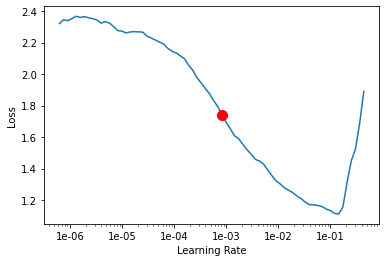

In [ ]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [ ]:
learn.show_results(rows=3, figsize=(10,10))

set the learning rate

In [ ]:
lr = 3.63E-03
learn.fit_one_cycle(6, slice(lr))

epoch,train_loss,valid_loss,error_rate,time
0,0.277417,0.098140,0.037407,03:15
1,0.152540,0.060140,0.017407,03:13
2,0.094510,0.035611,0.010741,03:14
3,0.082762,0.039459,0.011481,03:13
4,0.057144,0.014411,0.004074,03:14
5,0.030979,0.016833,0.007037,03:13


In [ ]:
learn.unfreeze()
learn.fit_one_cycle(3, slice(1e-6, lr/10))

epoch,train_loss,valid_loss,error_rate,time
0,0.059264,0.019892,0.007778,04:20
1,0.036364,0.013014,0.004074,04:19
2,0.033255,0.012440,0.004074,04:19


epoch,train_loss,valid_loss,error_rate,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


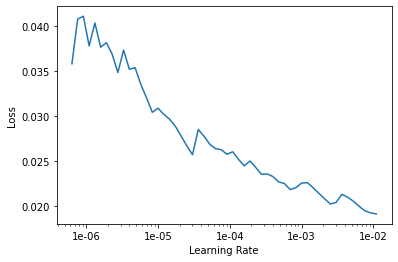

In [ ]:
learn.freeze()
learn.lr_find()
learn.recorder.plot()

Improved Prediction Accuracy

In [ ]:
learn.fit_one_cycle(1, slice(1e-5/2))

epoch,train_loss,valid_loss,error_rate,time
0,0.030834,0.010734,0.004074,03:14


In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
losses,idxs = interp.top_losses()
len(data.valid_ds)==len(losses)==len(idxs)

True

Confusion Matrix After Improving the accuracy of the Model

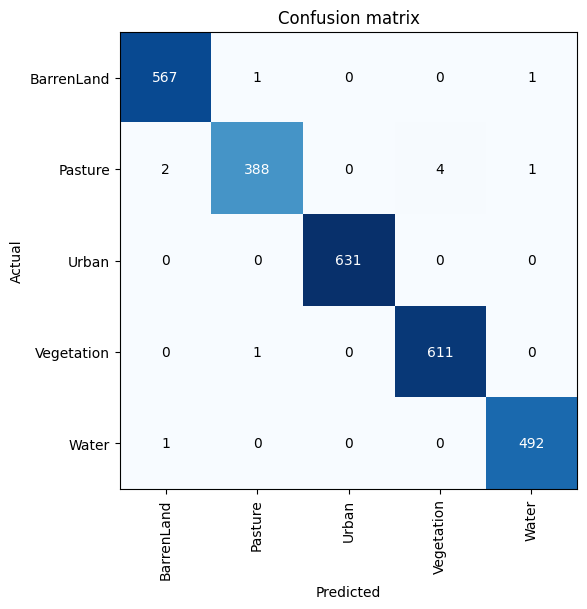

In [ ]:
interp.plot_confusion_matrix(figsize=(6,6), dpi=100)

In [ ]:
interp.most_confused(min_val=5)

[('Vegetation', 'Water', 453),
 ('Urban', 'BarrenLand', 285),
 ('BarrenLand', 'Water', 258),
 ('Urban', 'Water', 221),
 ('Water', 'Vegetation', 195),
 ('Pasture', 'Vegetation', 181),
 ('Pasture', 'BarrenLand', 161),
 ('Water', 'BarrenLand', 151),
 ('BarrenLand', 'Vegetation', 131),
 ('Urban', 'Vegetation', 124),
 ('Pasture', 'Water', 53),
 ('Vegetation', 'BarrenLand', 44)]

In [ ]:
interp.most_confused(min_val=5)

[]

**Results of Predictions**

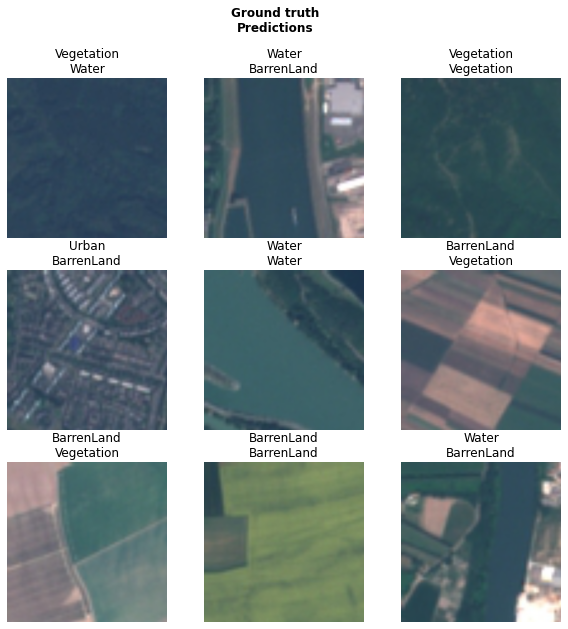

In [ ]:
learn.show_results(rows=3, figsize=(10,10))

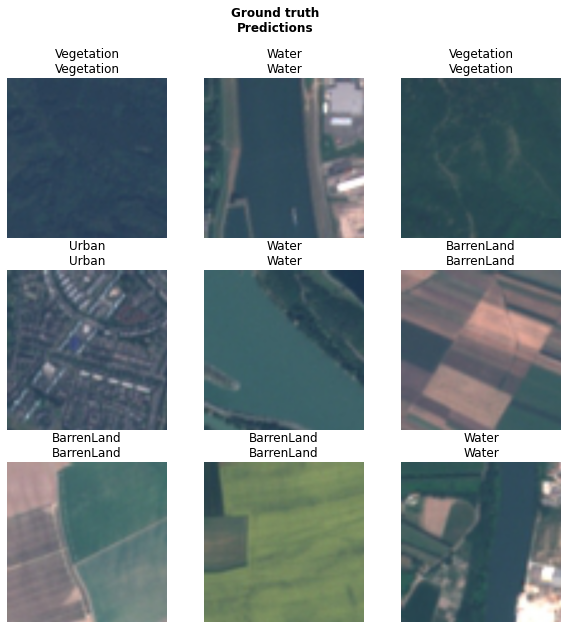

In [ ]:
learn.show_results(rows=3, figsize=(10,10))

In [ ]:
learn.export()
learn = load_learner(path)

In [ ]:
learn.data.classes

['BarrenLand', 'Pasture', 'Urban', 'Vegetation', 'Water']